In [1]:
import pandas as pd
import numpy as np

from matplotlib import pyplot as plt
from matplotlib import tri

from itertools import combinations
from collections import Counter

from scipy.interpolate import interp1d

import shap
#shap.initjs()

Select zones:

In [2]:
m_vals = [0.013, 0.02, 0.05, 0.06, 0.07, 0.1]

In [3]:
%%time
def read_m(m):
    selected_zones = []
    for i in range(48):
        df = pd.read_csv(f'm{m}/{i}.csv')
        df.columns = ['U_x', 'U_y', 'U_z', 'p', 'T', 'x', 'y', 'z']
        if df['y'].min() < 0:
            selected_zones.append(i)
    df = pd.concat(pd.read_csv(f'm{m}/{i}.csv') for i in selected_zones)
    df.columns = ['U_x', 'U_y', 'U_z', 'p', 'T', 'x', 'y', 'z']
    df = df[df['y'] == 0]
    df.drop_duplicates(['x', 'z'], inplace=True)
    df['m'] = m
    return df[['m', 'x', 'z', 'p', 'T', 'U_x', 'U_y', 'U_z']]
    
df = pd.concat(read_m(m) for m in m_vals)

CPU times: user 39.8 s, sys: 1.36 s, total: 41.2 s
Wall time: 41.2 s


Center and scale coordinates:

In [4]:
R_c = 0.00235
x_c = 2
df['x'] = (df['x'] - x_c) / R_c
df['z'] = df['z'] / R_c

In [5]:
def contour_plot(x, y, z, title, xlabel, ylabel, zlabel):
    plt.figure(figsize=(12, 10))
    plt.title(title, fontsize=14)
    plt.tricontourf(x, y, z, cmap='coolwarm', levels=200)
    cbar = plt.colorbar().set_label(zlabel, fontsize=14)
    plt.xlabel(xlabel, fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    plt.show()

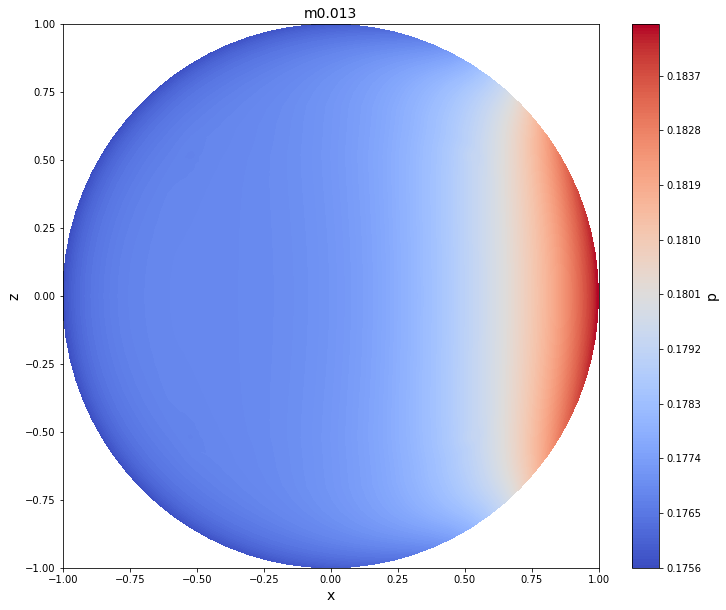

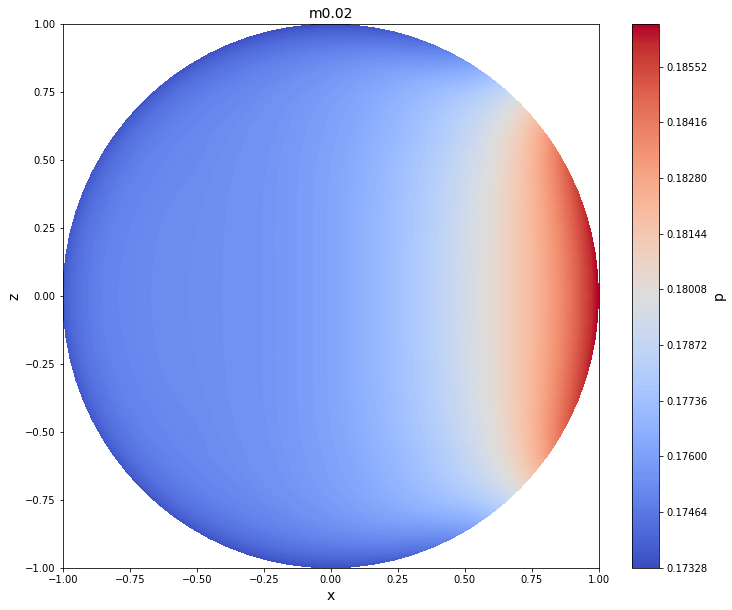

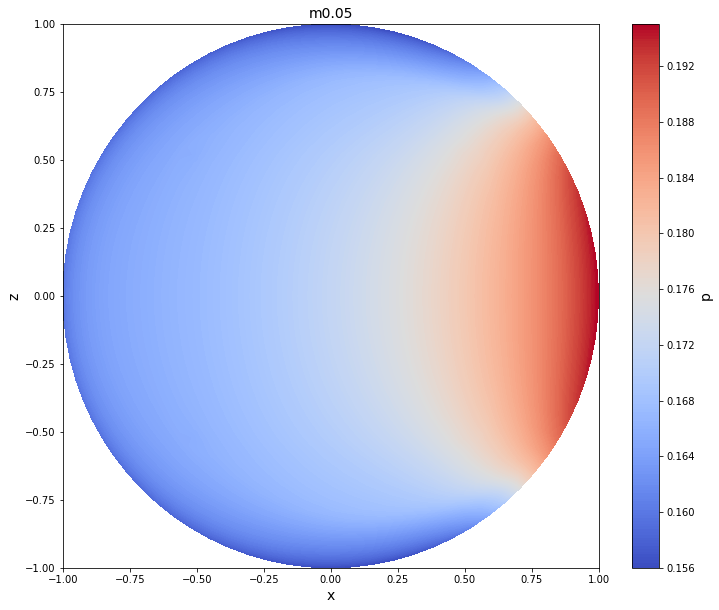

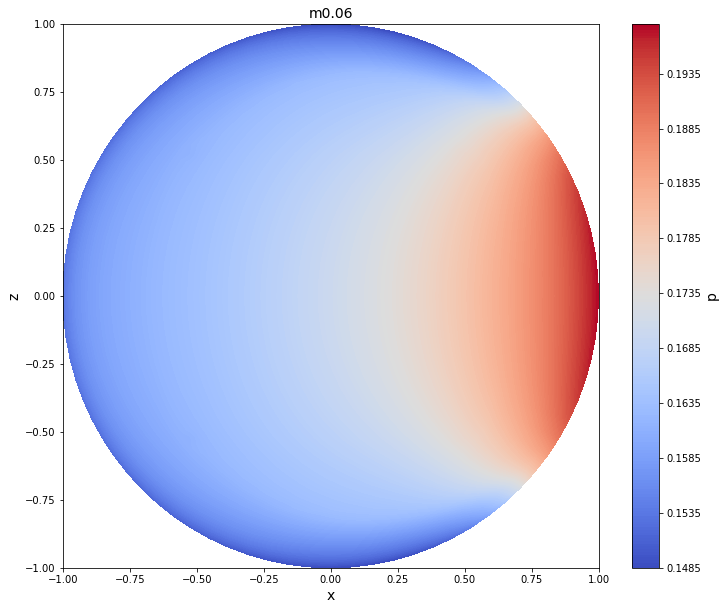

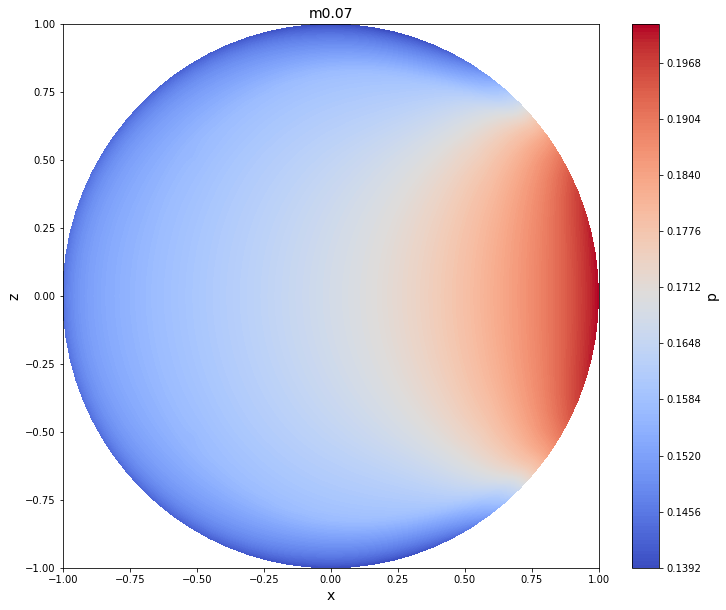

...

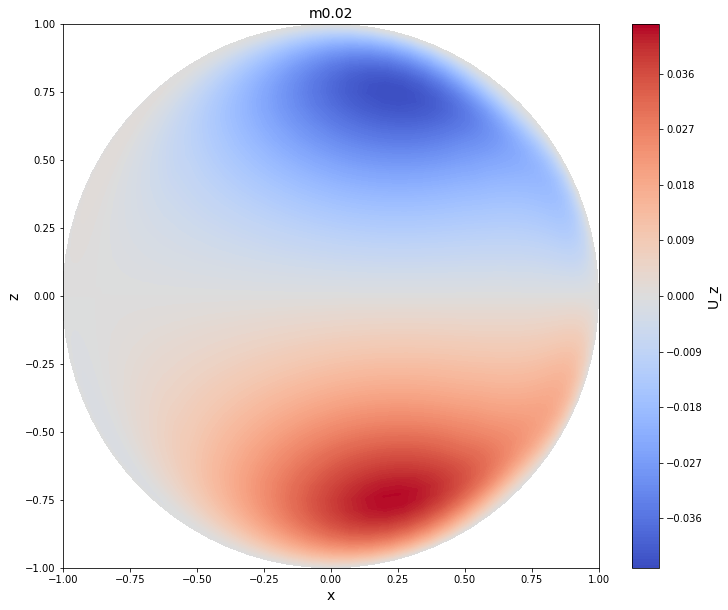

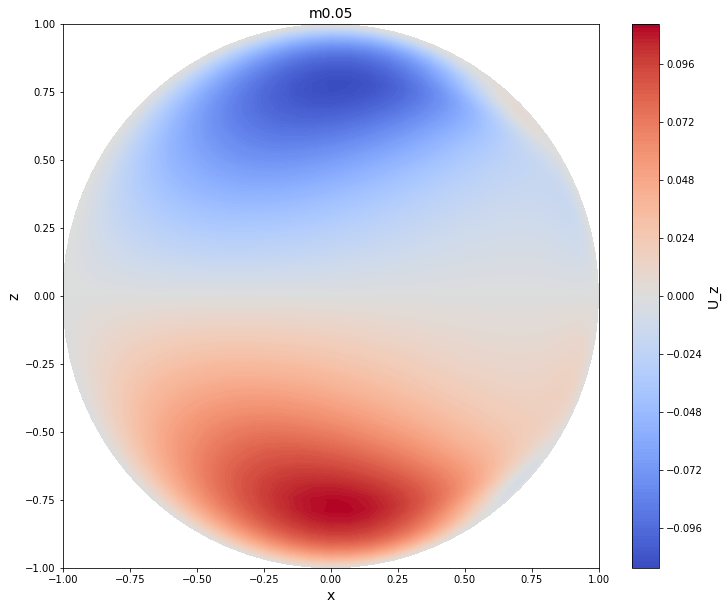

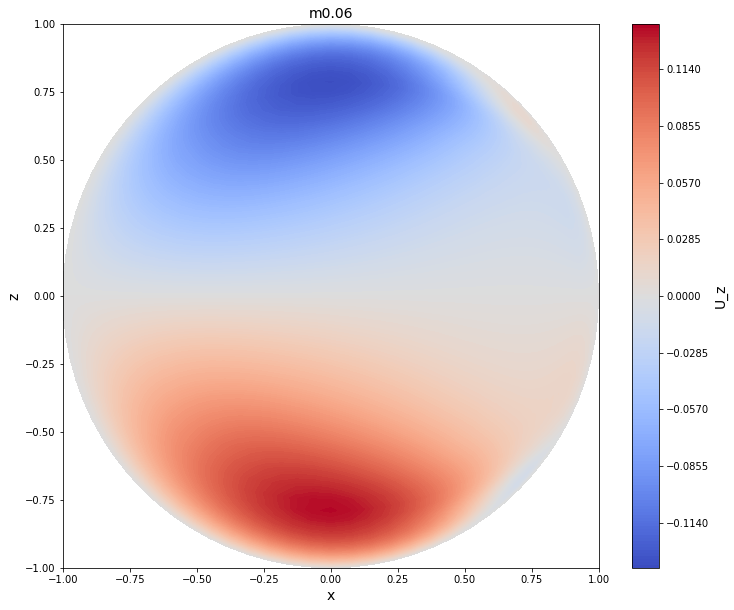

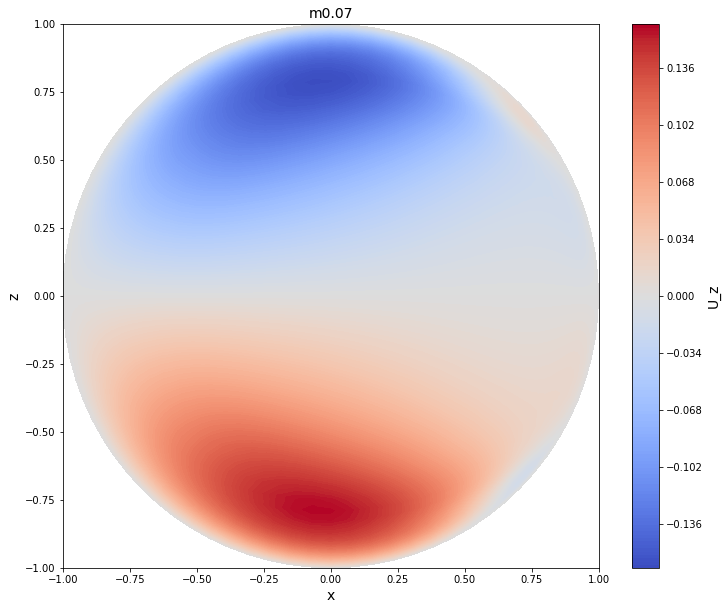

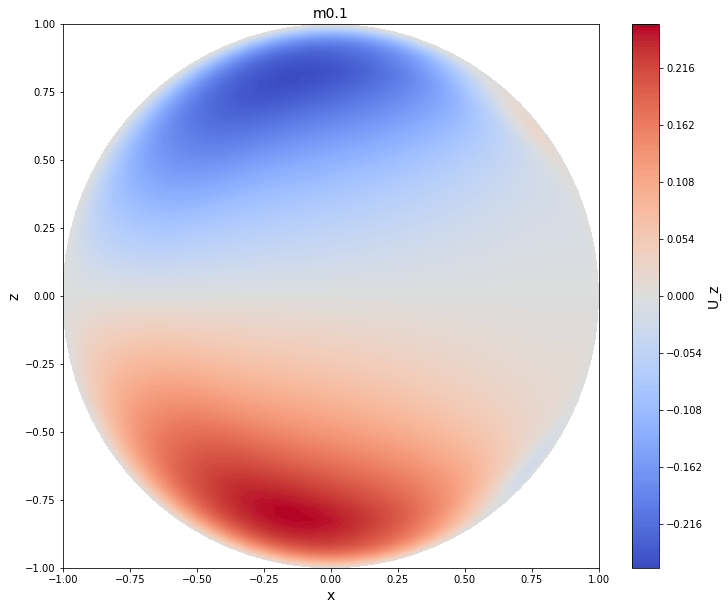

In [6]:
for var in ['p', 'T', 'U_x', 'U_y', 'U_z']:
    for m in m_vals:
        t = df[df['m'] == m]
        contour_plot(t['x'], t['z'], t[var], f'm{m}', 'x', 'z', var)

Approximations from test case:

In [7]:
def T_test(x, z, T_mean=1.68):
    return T_mean * np.ones_like(x)

def p_test(x, z, P_min=0.175, P_max=0.1865, gamma=3.7):
    return P_min + (P_max - P_min) * ((x + 1) / 2)**gamma

def U_x_test(x, z, X_sh=0.3, v_max=0.087, gamma=4):
    x_wave = x - X_sh
    y_wave = z
    r = np.sqrt(x_wave**2 + y_wave**2)
    cos_phi = x_wave / r
    sin_phi = y_wave / r
    R = -X_sh * cos_phi + np.sqrt(np.abs(1 - X_sh ** 2 * sin_phi ** 2))
    R_wave = r / R
    return v_max * (1 - R_wave ** gamma)

def U_y_test(x, z, a_0=-0.0494, a_2=-0.0401, a_4=0.1207, a_6=-0.4151, a_8=0.3806, X_sh=0.5, delta=0.1):
    y = z / np.sqrt(np.abs(1 - x**2))
    F_y = a_0 + a_2 * y**2 + a_4 * y**4 + a_6 * y**6 + a_8 * y**8
    F_x = (x + 1) / (X_sh + 1) / (1 + np.exp((x - X_sh) / delta)) + np.sqrt(np.abs((1 - x) / (1 - X_sh))) / (1 + np.exp((X_sh - x) / delta))
    return F_x * F_y

def U_z_test(x, z, X_sh=0.3, Y_sh=0.8, delta=0.1, v_max=0.045):
    y = z / np.sqrt(np.abs(1 - x**2))
    F_x = (x + 1) / (X_sh + 1) / (1 + np.exp((x - X_sh) / delta)) + (1 - x) / (1 - X_sh) / (1 + np.exp((X_sh - x) / delta))
    F_y = (np.abs(y) + 1) / (Y_sh + 1) / (1 + np.exp((np.abs(y) - Y_sh) / delta)) + (1 - np.abs(y)) / (1 - Y_sh) / (1 + np.exp((Y_sh - np.abs(y)) / delta))
    return v_max * F_x * F_y * np.sign(y)

F_test = {
    'p': p_test,
    'T': T_test,
    'U_x': U_x_test,
    'U_y': U_y_test,
    'U_z': U_z_test
}

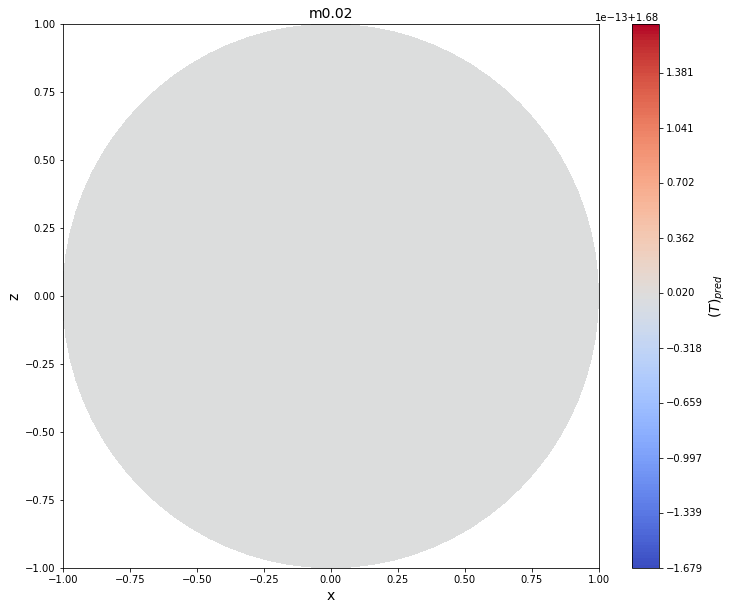

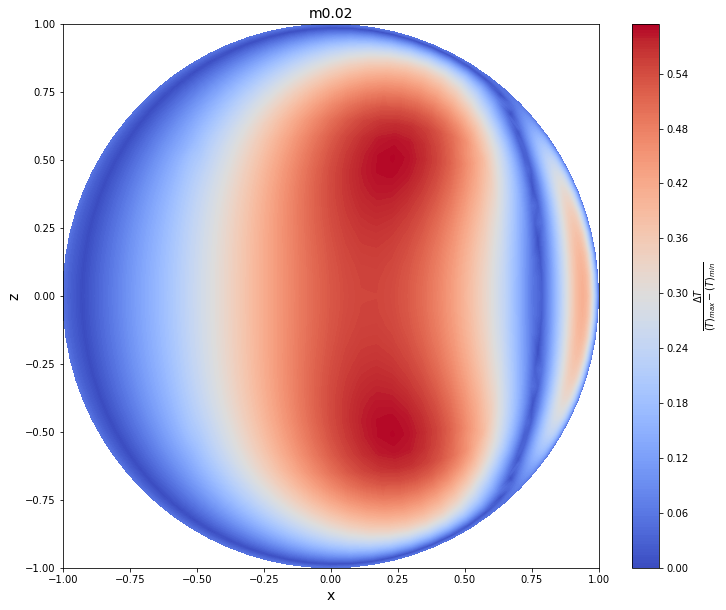

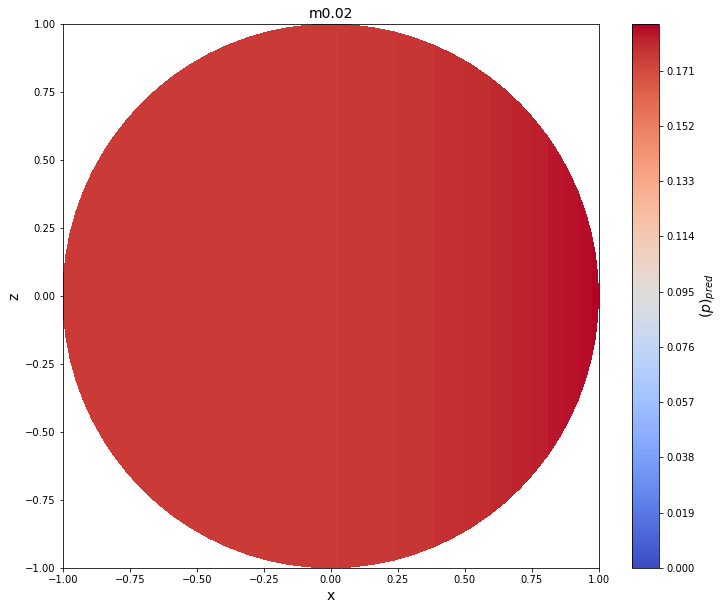

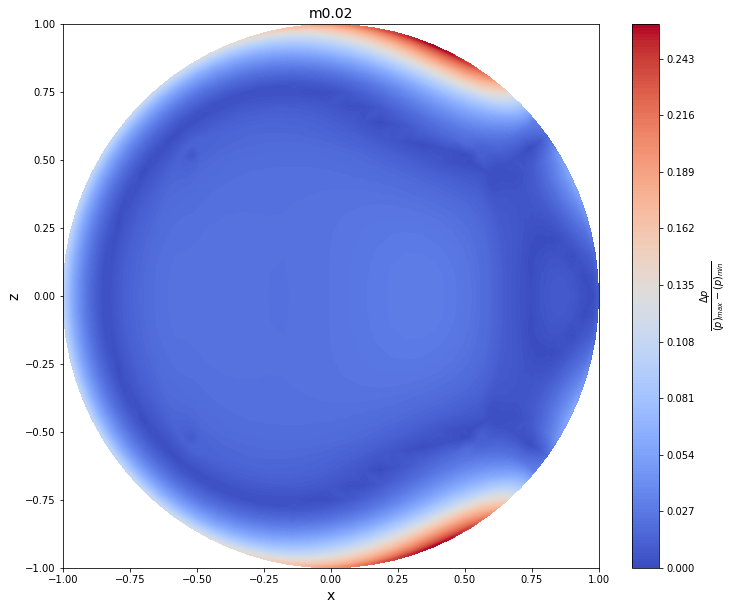

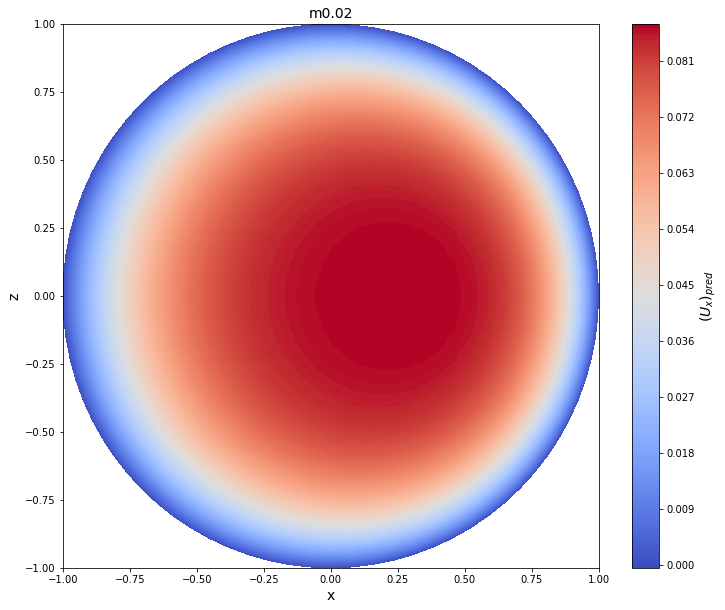

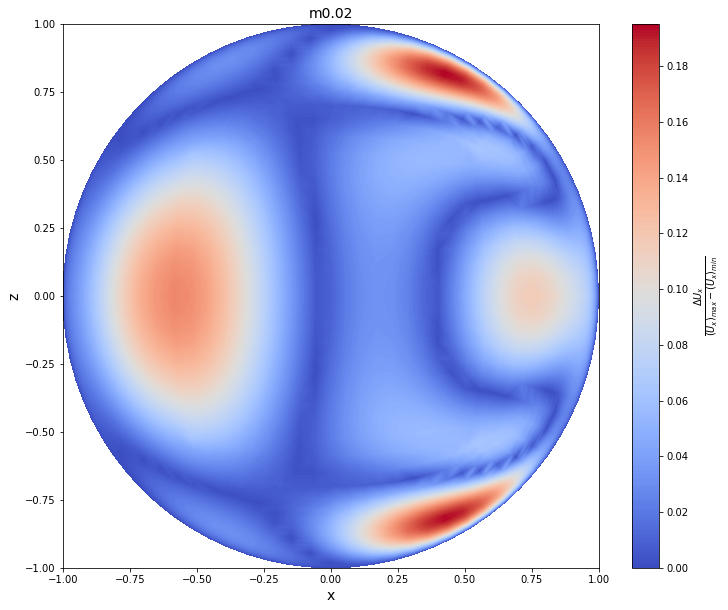

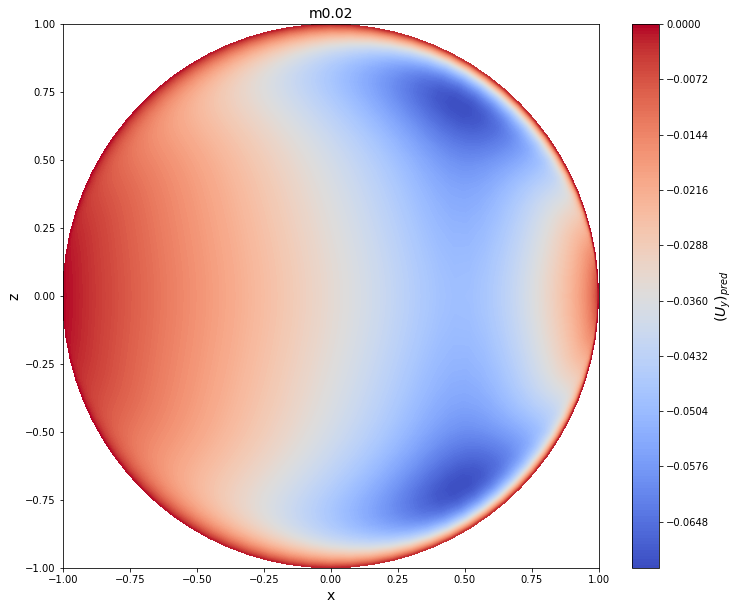

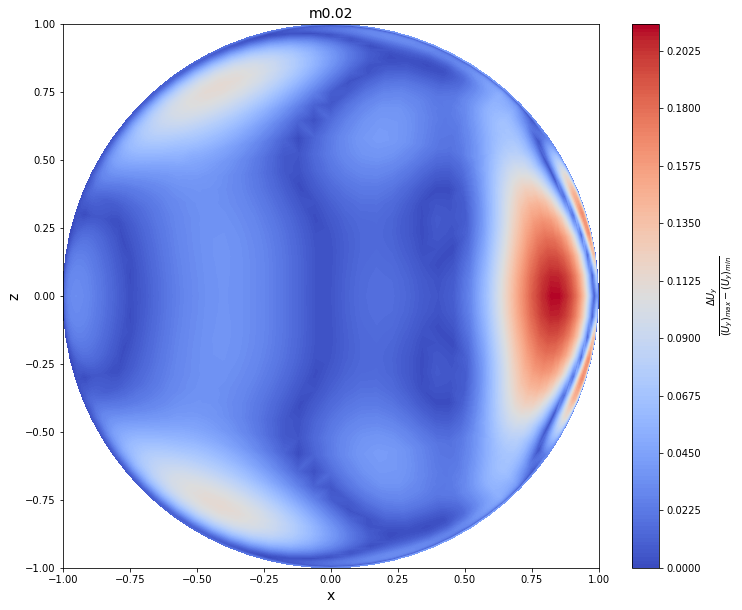

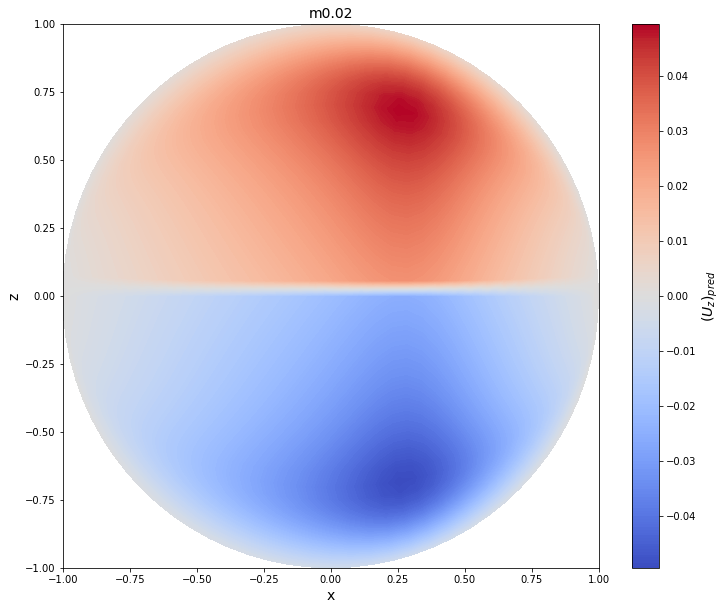

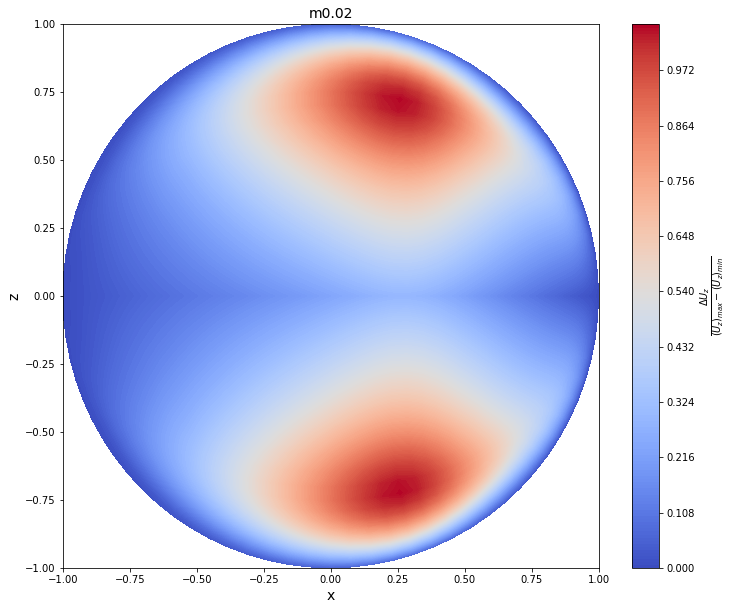

In [8]:
m = 0.02
for var in ['T', 'p', 'U_x', 'U_y', 'U_z']:
    t = df[df['m'] == m]
    target = t[var]
    preds = F_test[var](t['x'], t['z'])
    res = np.nan_to_num(np.abs(preds - target) / (np.max(target) - np.min(target)))
    contour_plot(t['x'], t['z'], np.nan_to_num(preds), f'm{m}', 'x', 'z', var.join([r'$(', r')_{pred}$']))
    contour_plot(t['x'], t['z'], res, f'm{m}', 'x', 'z', var.join([r'$\frac{\Delta ', r'}{(', ')_{max}-(',')_{min}}$']))

Shuffle:

In [9]:
df = df.sample(frac=1, random_state=42).reset_index(drop=True)

In [10]:
X = df[['m', 'x', 'z']].copy()
y = df[['p', 'T', 'U_x', 'U_y', 'U_z']].copy()

Polar coordinates:

In [11]:
X['r'] = np.sqrt(X['x']**2 + X['z']**2)
X[r'\cos{\phi}'] = X['x'] / X['r']
X[r'\sin{\phi}'] = X['z'] / X['r']
X[r'\phi'] = np.arctan2(X['x'], X['z'])

Combinations:

In [12]:
for v1, v2 in combinations(['x', 'z', r'\cos{\phi}', r'\sin{\phi}'], 2):
    X[f'{v1} {v2}'] = X[v1] * X[v2]
for v1, v2, v3 in combinations(['x', 'z', r'\cos{\phi}', r'\sin{\phi}'], 3):
    X[f'{v1} {v2} {v3}'] = X[v1] * X[v2] * X[v3]
for var in ['x', 'z', 'x z']:
    X[f'r {var}'] = X['r'] * X[var]

Polinomial features:

In [13]:
for var in ['x', 'z', r'\cos{\phi}', r'\sin{\phi}']:
    X[f'sign({var})'] = np.sign(X[var])
    X[f'|{var}|'] = np.abs(X[var])
    for p in range(2, 11):
        X[f'{var}^{p}'] = X[var] ** p
    X[f'|{var}|{var}'] = np.abs(X[var]) * X[var]
    for p in range(2, 10):
        X[f'|{var}|{var}^{p}'] = np.abs(X[var]) * X[var] ** p

Additional variables (Fourier series):

In [14]:
fourier_basis = []
for var in ['x', 'z', 'r']:
    X[f'sin{var}'] = np.sin(X[var])
    X[f'cos{var}'] = np.cos(X[var])
    fourier_basis += [f'sin{var}', f'cos{var}']
    for k in range(2, 11):
        X[f'sin{k}{var}'] = np.sin(k * X[var])
        X[f'cos{k}{var}'] = np.cos(k * X[var])
        fourier_basis += [f'sin{k}{var}', f'cos{k}{var}']

Variables from previous research:

In [15]:
# X['x^3.7'] = X['x']**3.7
X[r'\sqrt{1 - 0.09\sin\phi^2}'] = np.sqrt(np.abs(1 - 0.09 * X[r'\sin{\phi}'] ** 2))
X[r'\dfrac{r}{R}'] = X['r'] / (-0.3*X[r'\cos{\phi}'] + X[r'\sqrt{1 - 0.09\sin\phi^2}'])
X[r'\left(\dfrac{r}{R}\right)^4'] = X[r'\dfrac{r}{R}'] ** 4
X['Y'] = X['z'] / np.sqrt(np.abs(1 - X['x'] ** 2))
X[r'\dfrac{1}{1+e^{10x-5}}'] = 1 / (1 + np.exp(10 * X['x'] - 5))
X['x/(1+exp(10x-5))'] = X['x'] * X[r'\dfrac{1}{1+e^{10x-5}}']
X['sqrt(|1-x|)/(1+exp(5-10x))'] = np.sqrt(np.abs(1 - X['x'])) / (1 + np.exp(5 - 10 * X['x']))
for p in range(2, 9):
    X[f'Y^{p}'] = X['Y'] ** p
    X[r'\dfrac{Y^{' + str(p) + '}}{1+e^{10x-5}}'] = X['Y'] ** p * X[r'\dfrac{1}{1+e^{10x-5}}']
    X[r'\dfrac{x Y^{' + str(p) + '}}{1+e^{10x-5}}'] = X['Y'] ** p * X['x/(1+exp(10x-5))']
    X[r'\dfrac{Y^{' + str(p) + '}\sqrt{|1-x|}}{1+e^{10x-5}}'] = X['Y'] ** p * X['sqrt(|1-x|)/(1+exp(5-10x))']

X[r'\dfrac{1}{1+e^{10x-3}}'] = 1 / (1 + np.exp(10 * X['x'] - 3))
X[r'\dfrac{x}{1+e^{10x-3}}'] = X['x'] * X[r'\dfrac{1}{1+e^{10x-3}}']
X[r'\dfrac{1}{1+e^{3-10x}}'] = 1 / (1 + np.exp(3 - 10 * X['x']))
X[r'\dfrac{x}{1+e^{3-10x}}'] = X['x'] * X[r'\dfrac{1}{1+e^{3-10x}}']
X[r'\dfrac{signY}{1+e^{10|Y|-8}}'] = np.sign(X['Y']) / (1 + np.exp(10 * np.abs(X['Y']) - 8))
X[r'\dfrac{Y}{1+e^{10|Y|-8}}'] = np.abs(X['Y']) / (1 + np.exp(10 * np.abs(X['Y']) - 8))
X[r'\dfrac{signY}{1+e^{8-10|Y|}}'] = np.sign(X['Y']) / (1 + np.exp(10 * np.abs(8 - X['Y'])))
X[r'\dfrac{Y}{1+e^{8-10|Y|}}'] = np.abs(X['Y']) / (1 + np.exp(10 * np.abs(8 - X['Y'])))
for v1, v2 in combinations([r'\dfrac{1}{1+e^{10x-3}}', r'\dfrac{x}{1+e^{10x-3}}', r'\dfrac{1}{1+e^{3-10x}}', r'\dfrac{x}{1+e^{3-10x}}', r'\dfrac{signY}{1+e^{10|Y|-8}}', r'\dfrac{Y}{1+e^{10|Y|-8}}', r'\dfrac{signY}{1+e^{8-10|Y|}}', r'\dfrac{Y}{1+e^{8-10|Y|}}'], 2):
    X[r'\cdot'.join([v1, v2])] = X[v1] * X[v2]

for var in ['x', 'z', 'r', r'\cos{\phi}', r'\sin{\phi}']:
    X[f'e^{var}'] = np.exp(X[var])
    X[f'e^-{var}'] = np.exp(-X[var])
    X['\sqrt{|{' + var + '}| + 1}'] = np.sqrt(np.abs(X[var]) + 1)

Feature selection:

In [16]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge

In [17]:
def select_features(model_type, model_params, var, features, n):
    top_features = Counter()
    for m in m_vals:
        data = X[X['m'] == m]
        target = y[X['m'] == m][var]
        model = model_type(**model_params)
        model.fit(data[features], target)
        explainer = shap.LinearExplainer(model, data[features])
        shap_values = explainer.shap_values(data[features])
        top_features.update(features[i] for i in np.argsort(np.abs(shap_values).sum(axis=0))[-(n-1):])
    selected_features = [feature for (feature, count) in top_features.most_common(n-1)]
    coefs = []
    for m in m_vals:
        data = X[X['m'] == m]
        target = y[X['m'] == m][var]
        model = model_type(**model_params)
        model.fit(data[selected_features], target)
        coefs.append([model.intercept_] + model.coef_.tolist())
        preds = model.predict(data[selected_features])
        contour_plot(data['x'], data['z'], target, f'm{m}', 'x', 'z', var.join([r'$', r'$']))
        contour_plot(data['x'], data['z'], np.nan_to_num(preds), f'm{m}', 'x', 'z', var.join([r'$(', r')_{pred}$']))
        contour_plot(data['x'], data['z'], np.abs(target - preds) / (np.max(target) - np.min(target)), f'm{m}', 'x', 'z', var.join([r'$\frac{\Delta ', r'}{(', ')_{max}-(',')_{min}}$']))
    coefs = np.array(coefs)
    plt.figure(figsize=(12, 9))
    for i, coef in enumerate(coefs.T):
        plt.scatter(m_vals, coef, marker='*')
        plt.title(r'$' + var + r'\sim a_0 + ' + '+'.join([f'a_{i + 1} {feat}' for (i, feat) in enumerate(selected_features)]) + r'$')
        plt.plot(m_vals, coef, '--', label=str(i).join([r'$a_{', r'}$']))
        plt.xlabel('m')
        plt.legend()
    return {
        "coef_interpolator": interp1d(m_vals, coefs.T),
        "feat_names": selected_features
    }

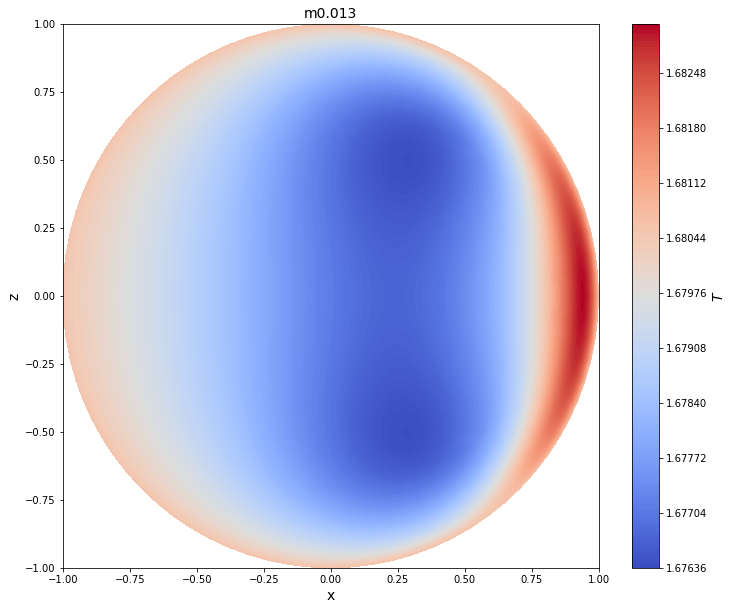

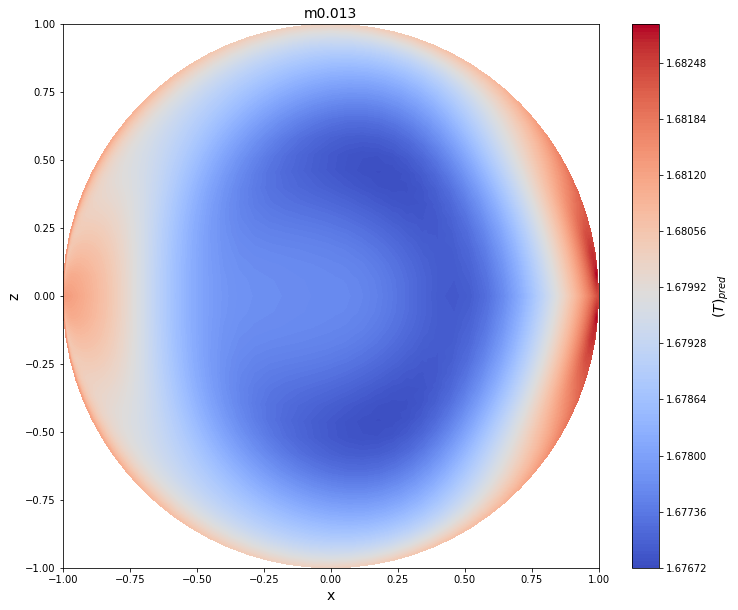

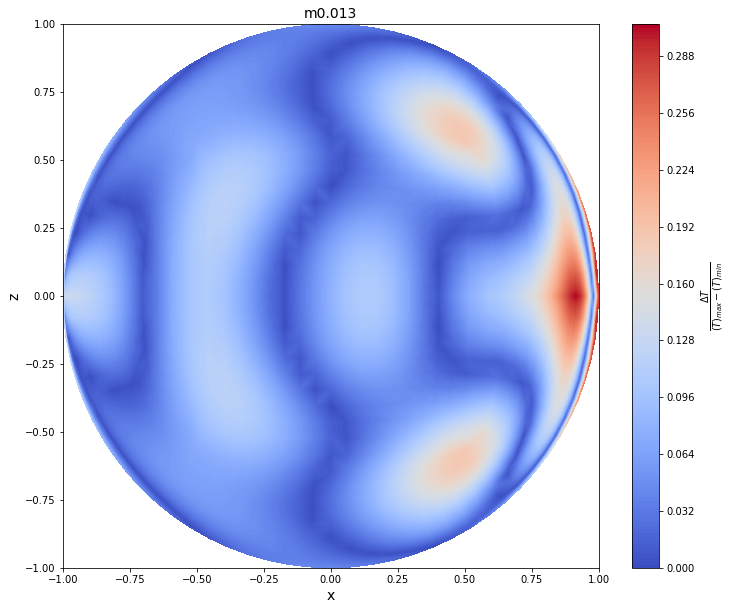

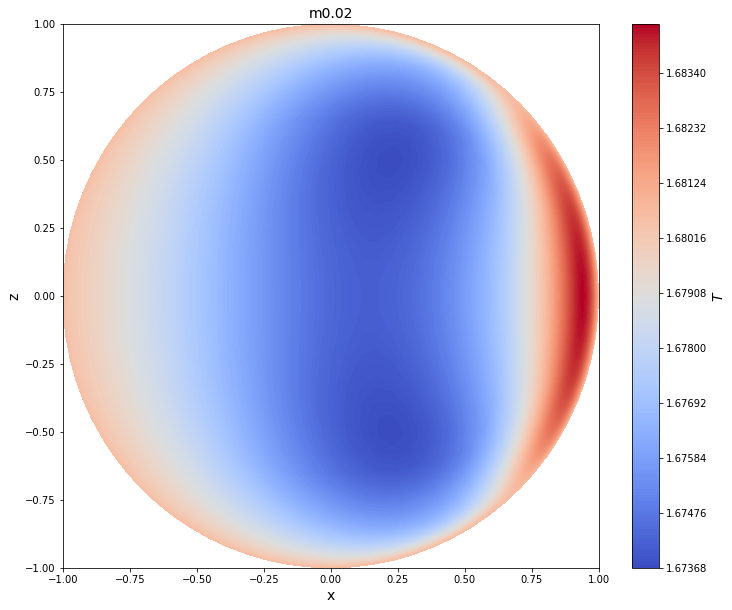

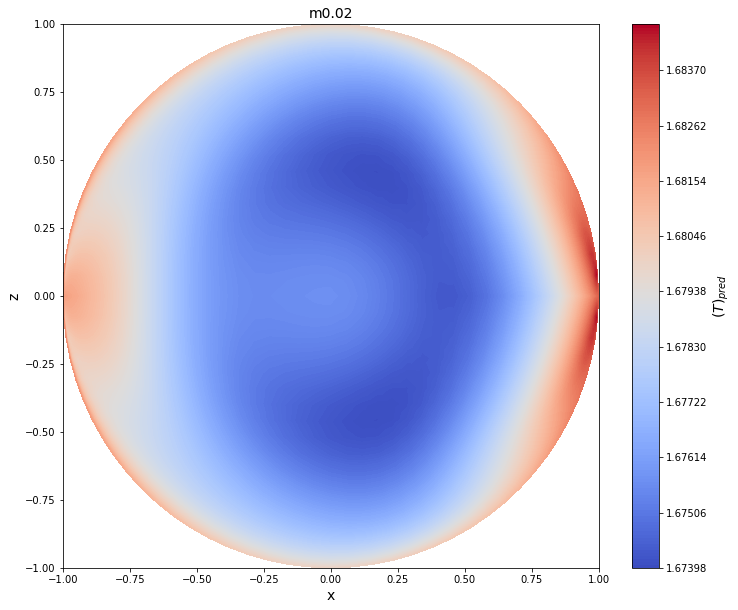

...

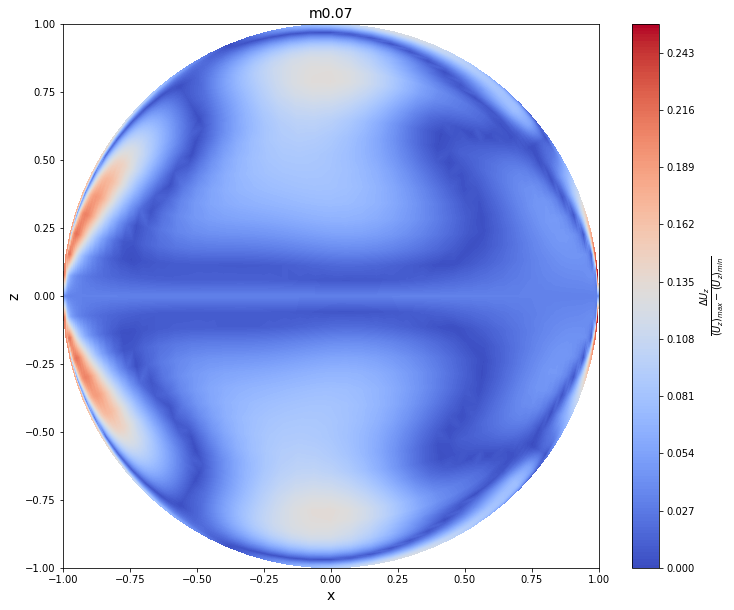

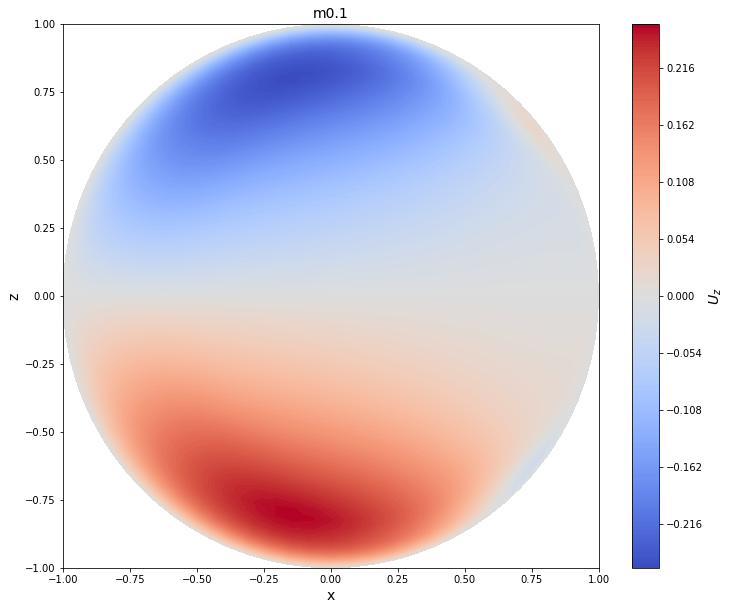

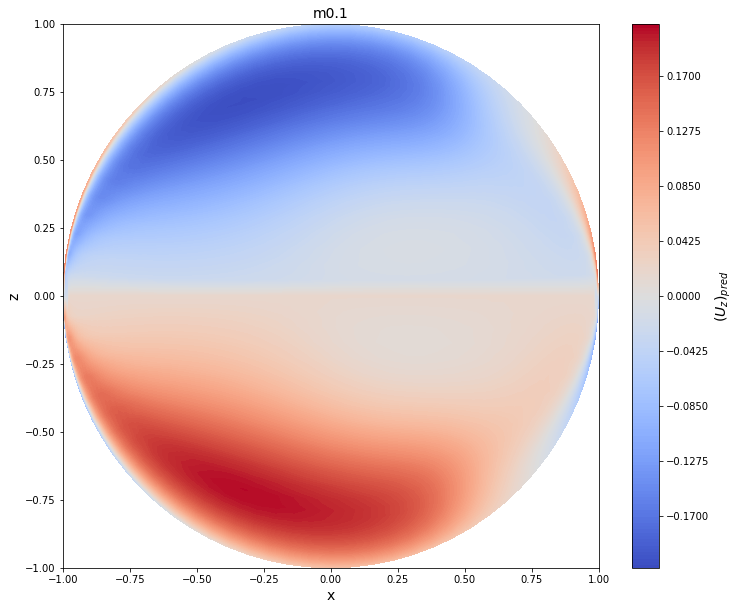

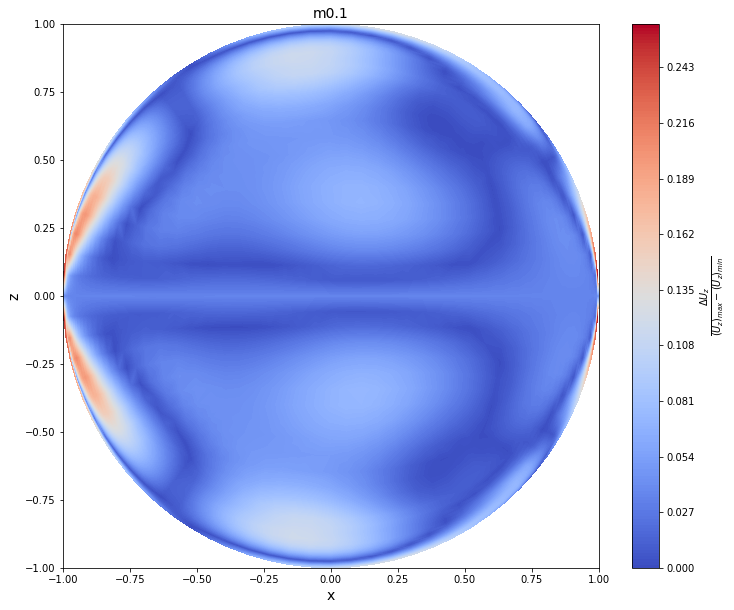

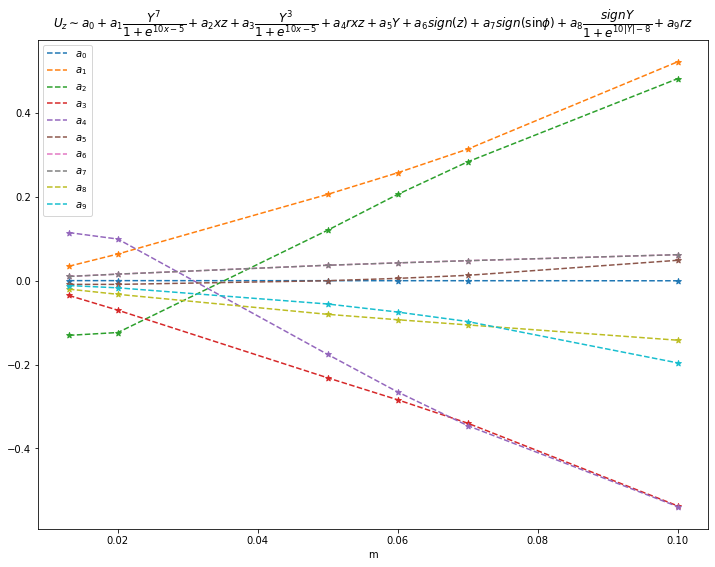

In [18]:
selected_features = {var: select_features(Ridge, {"alpha": 1e-2}, var, X.columns[1:], 10) for var in ['T', 'p', 'U_x', 'U_y', 'U_z']}

In [19]:
def get_equation(m, coef_interpolator, feat_names):
    coefs = coef_interpolator(m)
    print(' + '.join([str(coefs[0])] + [f'{coef}*{feat}' for (coef, feat) in zip(coefs[1:], feat_names)]))
    return coefs

In [20]:
get_equation(0.03, **selected_features['p'])

0.17416929641539597 + 0.00772376672375554*z \cos{\phi} \sin{\phi} + -0.002365924561606969*|\cos{\phi}|\cos{\phi}^3 + -0.00030754452674022553*|\cos{\phi}|\cos{\phi} + 0.00016651006319848136*r x + 0.0030558671184732194*\left(\dfrac{r}{R}\right)^4 + -0.028643259322604142*x z \sin{\phi} + -0.00369878746379173*\dfrac{Y^{2}\sqrt{|1-x|}}{1+e^{10x-5}} + -0.010438398610623685*\dfrac{Y^{8}}{1+e^{10x-5}} + 0.007069798951190106*sin2x


array([ 1.74169296e-01,  7.72376672e-03, -2.36592456e-03, -3.07544527e-04,
        1.66510063e-04,  3.05586712e-03, -2.86432593e-02, -3.69878746e-03,
       -1.04383986e-02,  7.06979895e-03])